In [7]:
import numpy as np
import os
from obspy.clients.iris import Client
import obspy.geodetics.base as base 
stafile="./Input/Stations.dat"
evefile="./Input/EventCatlog"
tstarPfile="./Output/P_tstar_selected.dat"
tstarSfile="./Output/S_tstar_selected.dat"
phasefile="./Input/phase.dat"

with open(phasefile,"r") as f:
    temp=f.read().splitlines()
    TravelTime={}
    for line in temp:
        para=line.split()
        if para[0]=="#":
            evid=para[1]
        else:
            staname,t,qual,phase=para
            t=float(t)
            key="_".join([evid,staname,phase])
            TravelTime[key]=t

with open(stafile,"r") as f:
    temp=f.read().splitlines()
    STA={}
    for line in temp:
        para=line.split()
        staname,lat,lon,dep=para
        STA[staname]=[float(lon),float(lat),-float(dep)/1000]
with open(evefile,"r") as f:
    temp=f.read().splitlines()
    EVE={}
    for line in temp:
        para=line.split()
        time,evid,lon,lat,dep,mag=para[0],para[9],para[3],para[2],para[4],para[5]
        EVE[evid]=list(map(float,[lon,lat,dep,mag,time]))
print(STA)
print(EVE)
def readTstarInformation(tstarfile,EVE,STA,TravelTime,phaseflag):
    with open(tstarfile,"r") as f:
        temp=f.read().splitlines()
        tstar_dist={}
        for line in temp:
            para=line.split()
            if para[0]=="#":
                evid=para[1]
                evelon,evelat,evedep,mag,time=EVE[evid]
            else:
                staname=para[0]
                stalon,stalat,stadep=STA[staname]
                tstar=float(para[1])
                fit=para[2]
                phase=para[3]
                dlat=stalat-evelat;dlon=stalon-evelon
                dist=np.sqrt((dlat*111)**2 + (dlon*(np.cos(evelat*3.1415926/180)*111))**2 + (evedep-stadep)**2 ) #
#                 result = Client().distaz(stalat,stalon,  evelat,evelon)
#                 baz=result['backazimuth'];
                dis,az,baz=base.gps2dist_azimuth(stalat,stalon,evelat,evelon)
                key="_".join([evid,staname,phaseflag])
                travelTime= TravelTime[key]
                if tstar<=0.00001:
                    Q=np.inf 
                else:
                    Q=travelTime/tstar   
            
                if staname in tstar_dist:
                    tstar_dist[staname].append([tstar,dist,evedep,baz,evelon,evelat,mag,time,Q])
                else:
                    tstar_dist[staname]=[]
                    tstar_dist[staname].append([tstar,dist,evedep,baz,evelon,evelat,mag,time,Q])
    return tstar_dist

{'G13': [-105.7065, -4.54, 3.402], 'G15': [-105.6009, -4.6566, 3.313], 'G14': [-105.7024, -4.6051, 3.926], 'G11': [-105.7917, -4.6205, 3.238], 'G12': [-105.8, -4.6778, 3.192], 'G03': [-106.1498, -4.6161, 3.187], 'G02': [-106.1992, -4.5465, 3.05], 'G01': [-106.2605, -4.4516, 3.209], 'G16': [-105.5842, -4.7169, 2.961], 'G05': [-106.0801, -4.4907, 3.558], 'G04': [-106.1266, -4.5553, 3.17], 'G10': [-105.8669, -4.5932, 3.395], 'G09': [-105.9097, -4.5022, 3.258], 'G06': [-106.0359, -4.5694, 3.601], 'G07': [-105.9685, -4.6591, 3.195], 'G08': [-105.9481, -4.5962, 3.358]}
{'3': [-105.916406, -4.587163, 7.912, 1.2, 20080101.0], '5': [-106.022632, -4.56419, 6.014, 1.6, 20080101.0], '7': [-105.706812, -4.628207, 7.036, 2.2, 20080101.0], '13': [-106.022599, -4.564233, 5.976, 1.6, 20080101.0], '14': [-106.022461, -4.564115, 5.917, 2.4, 20080101.0], '27': [-105.980884, -4.554135, 8.346, 1.3, 20080101.0], '34': [-105.827848, -4.60386, 8.699, 1.2, 20080101.0], '35': [-105.986035, -4.571337, 7.273, 2.9,

./Output/P_tstar_selected.dat ./Output/S_tstar_selected.dat


<Figure size 432x288 with 0 Axes>

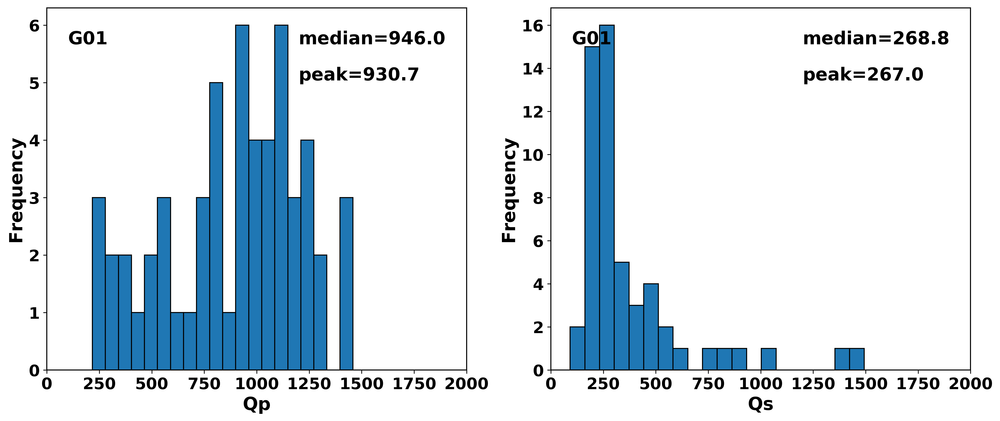

<Figure size 432x288 with 0 Axes>

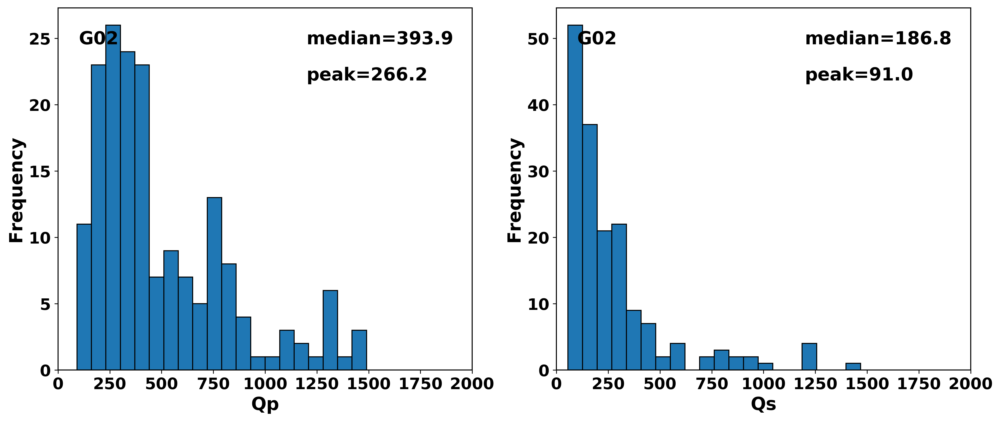

<Figure size 432x288 with 0 Axes>

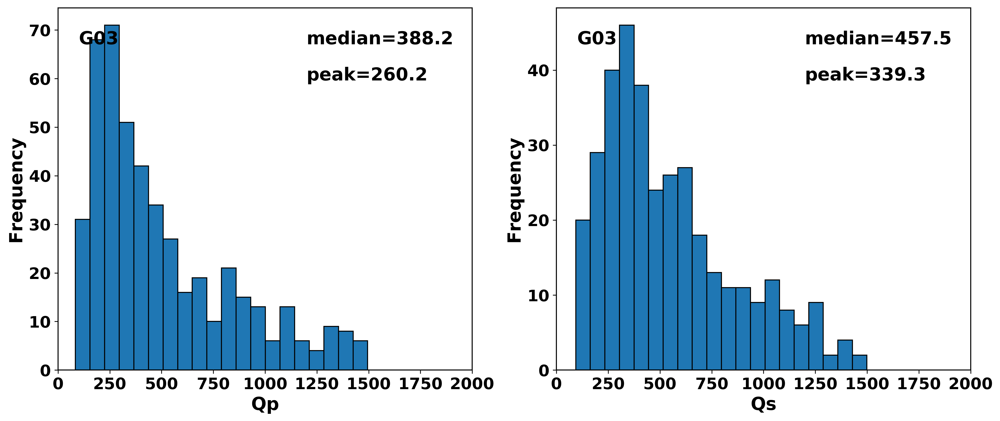

<Figure size 432x288 with 0 Axes>

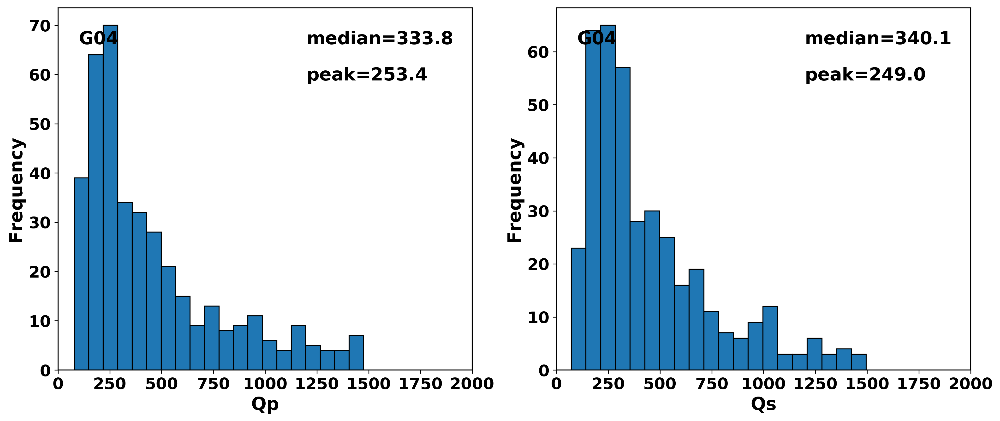

<Figure size 432x288 with 0 Axes>

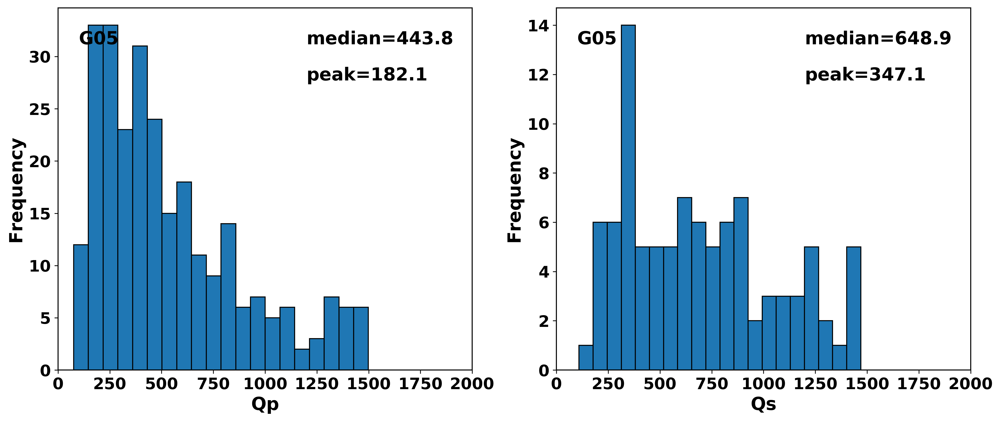

<Figure size 432x288 with 0 Axes>

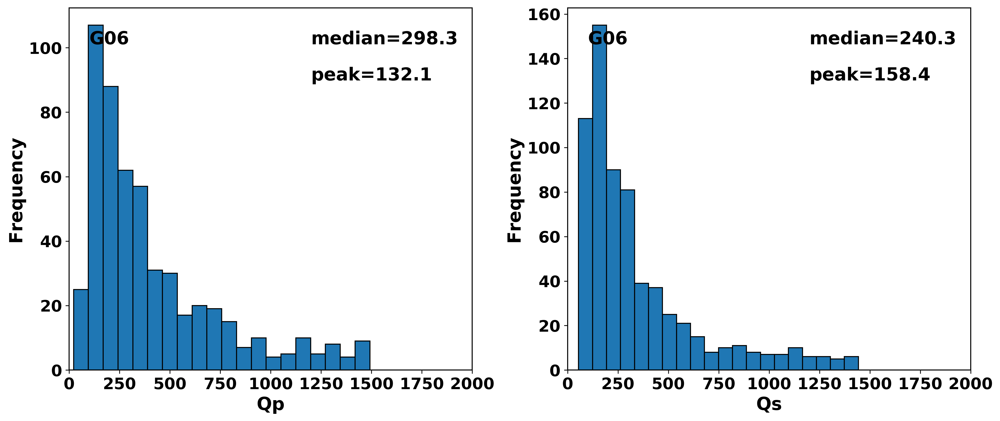

<Figure size 432x288 with 0 Axes>

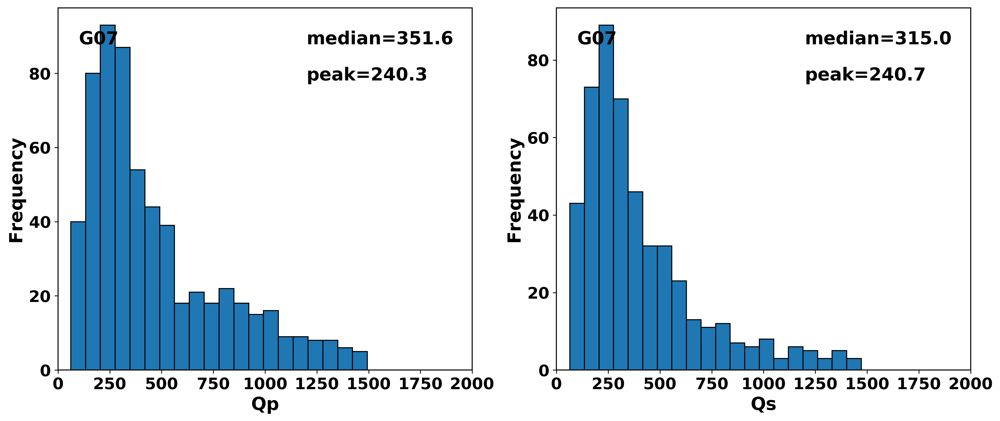

<Figure size 432x288 with 0 Axes>

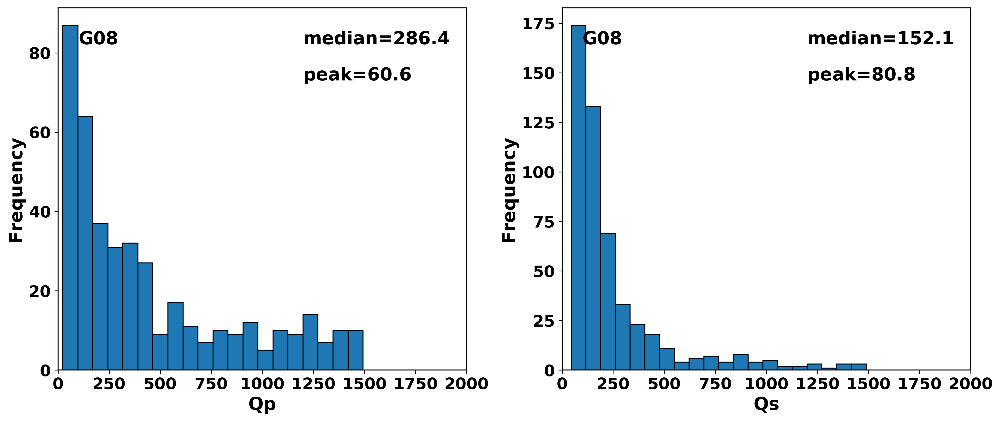

<Figure size 432x288 with 0 Axes>

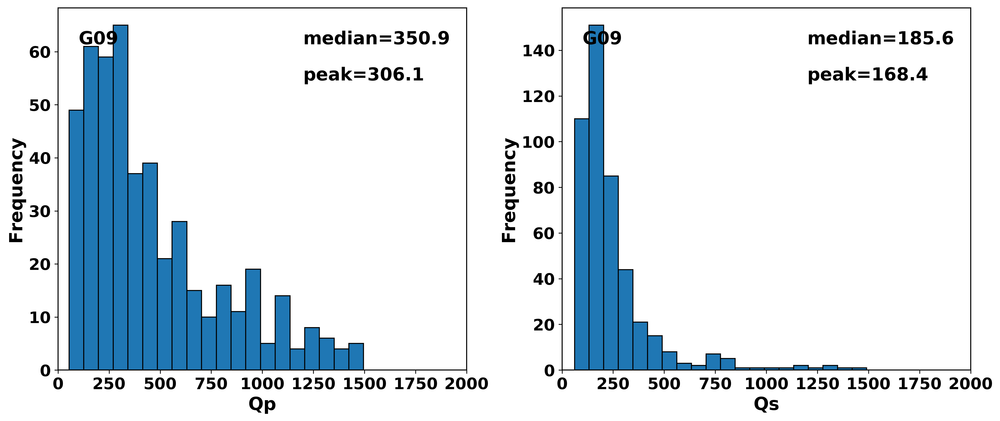

<Figure size 432x288 with 0 Axes>

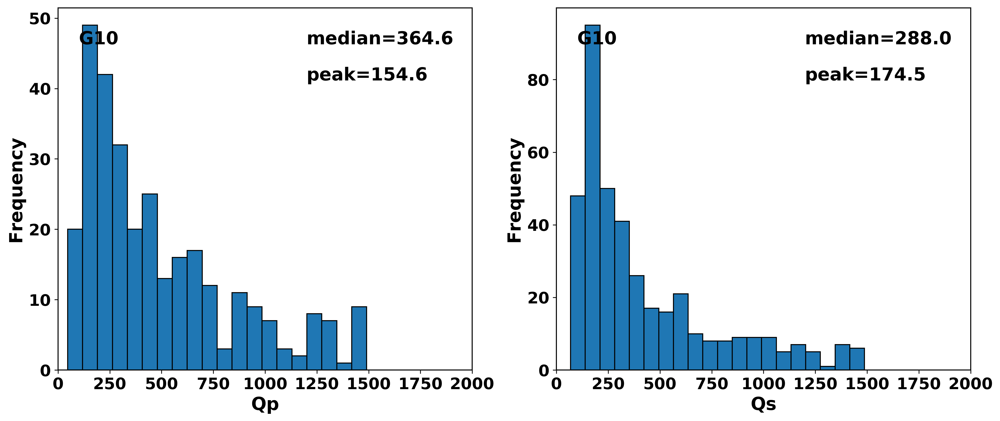

<Figure size 432x288 with 0 Axes>

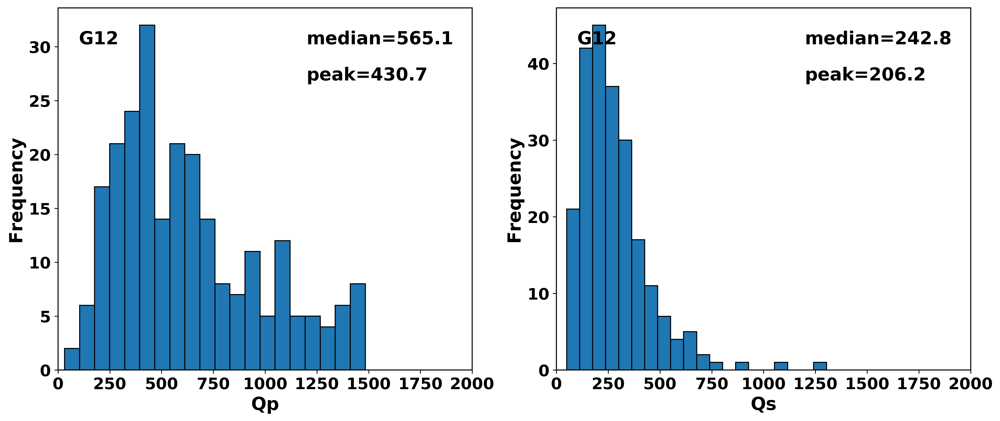

<Figure size 432x288 with 0 Axes>

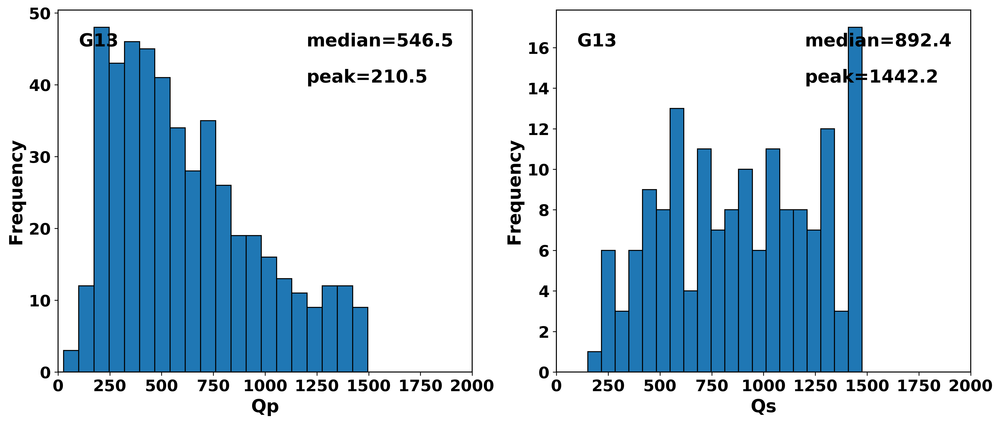

<Figure size 432x288 with 0 Axes>

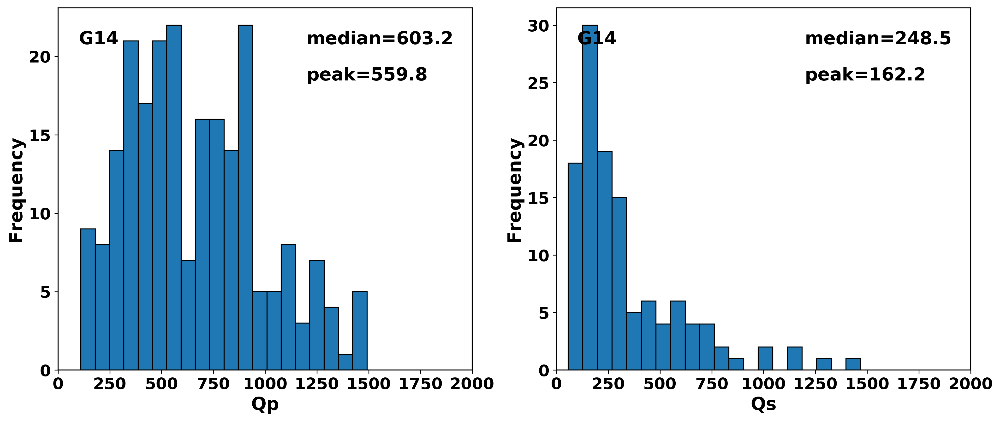

<Figure size 432x288 with 0 Axes>

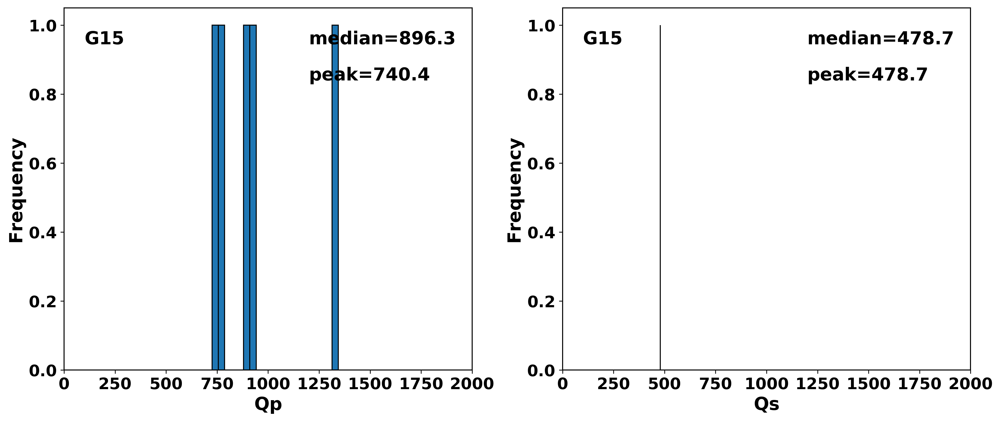

<Figure size 432x288 with 0 Axes>

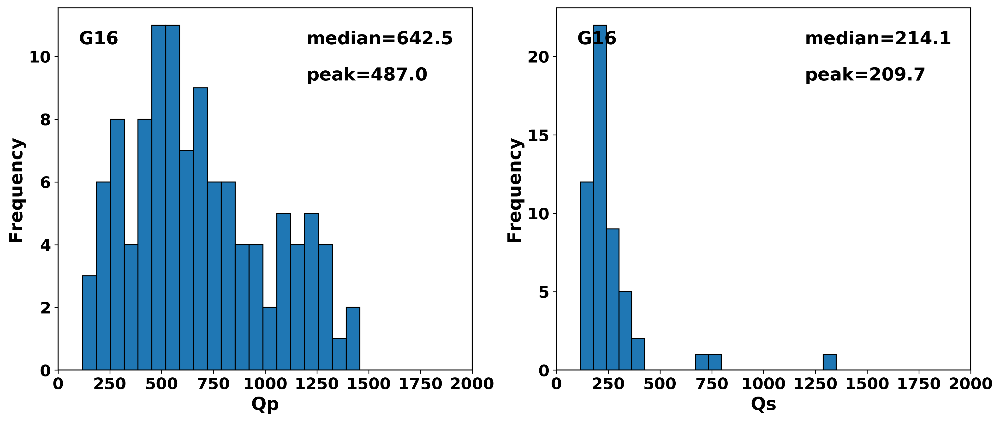

In [8]:
import matplotlib.pyplot as plt
# read tstarPfile and tstarSfile
print(tstarPfile,tstarSfile)
TstarP_Dist=readTstarInformation(tstarPfile,EVE,STA,TravelTime,"P")
TstarS_Dist=readTstarInformation(tstarSfile,EVE,STA,TravelTime,"S")
Qlim=2000
# tstar,dist,evedep,baz,evelon,evelat,mag,time,Q
for sta in ["G01","G02","G03","G04","G05",'G06','G07',"G08","G09","G10","G12","G13","G14","G15","G16"]:
    fig,ax=plt.subplots(1,2,figsize=(14,6))
    temp=np.array(TstarP_Dist[sta])
    Qp=temp[:,-1]
    Qp=Qp[Qp<Qlim]
    hist, bin_edges = np.histogram(Qp,bins=20)
    index=np.argmax(hist)
    Qp_max=(bin_edges[index+1]+bin_edges[index])/2
#     print(hist,bin_edges,index,len(Qp))
    ax[0].hist(Qp ,bins=20,edgecolor='black')
    ax[0].annotate(sta, xy=(0.05, 0.9), xycoords='axes fraction',fontsize=18)
    ax[0].annotate("median={:.1f}".format(np.median(Qp)), xy=(0.6, 0.9), xycoords='axes fraction',fontsize=18)
    ax[0].annotate("peak={:.1f}".format(Qp_max), xy=(0.6, 0.8), xycoords='axes fraction',fontsize=18)
    ax[0].set_xlim([0,Qlim])
    ax[0].set_xlabel("Qp")
    ax[0].set_ylabel("Frequency")
    temp=np.array(TstarS_Dist[sta])
    Qs=temp[:,-1]
    Qs=Qs[Qs<Qlim]
    hist, bin_edges = np.histogram(Qs,bins=20)
    index=np.argmax(hist)
    Qs_max=(bin_edges[index+1]+bin_edges[index])/2
    ax[1].hist(Qs ,bins=20,edgecolor='black')
    ax[1].annotate(sta, xy=(0.05, 0.9), xycoords='axes fraction',fontsize=18)
    ax[1].annotate("median={:.1f}".format(np.median(Qs)), xy=(0.6, 0.9), xycoords='axes fraction',fontsize=18)
    ax[1].annotate("peak={:.1f}".format(Qs_max), xy=(0.6, 0.8), xycoords='axes fraction',fontsize=18)
    
    ax[1].set_xlim([0,Qlim])
    ax[1].set_xlabel("Qs")
    ax[1].set_ylabel("Frequency")
    plt.tight_layout()
    plt.savefig("./Figure/Q_hist_{}.jpg".format(sta))
    plt.pause(0.1)
    plt.clf()
    


./Output/P_tstar_selected.dat ./Output/S_tstar_selected.dat


<Figure size 432x288 with 0 Axes>

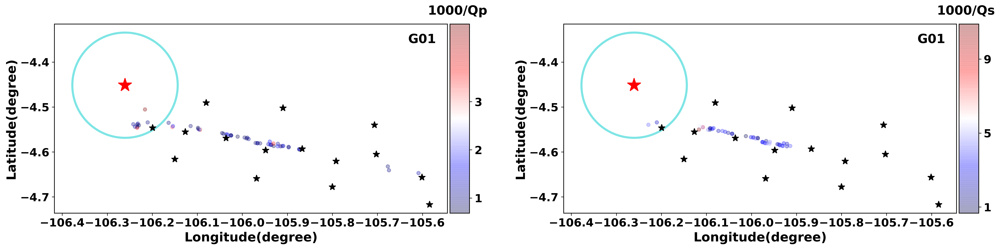

<Figure size 432x288 with 0 Axes>

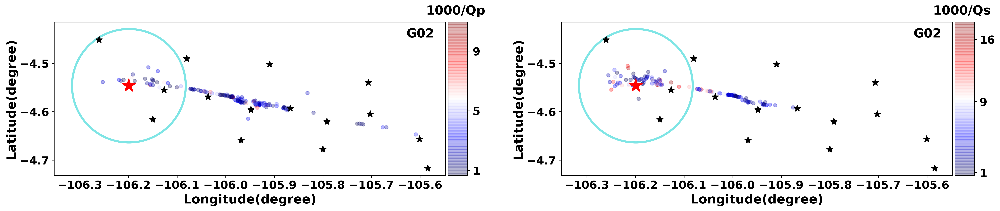

<Figure size 432x288 with 0 Axes>

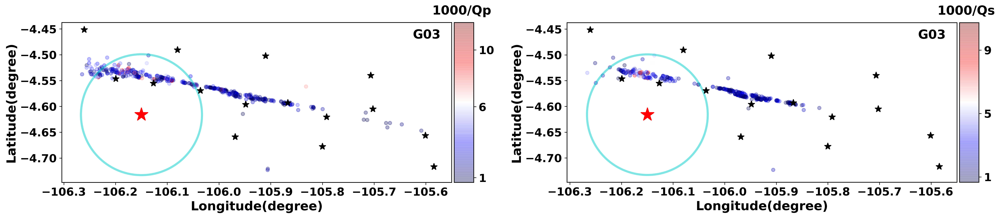

<Figure size 432x288 with 0 Axes>

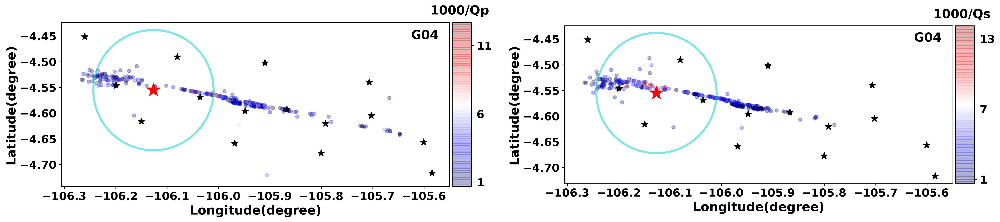

<Figure size 432x288 with 0 Axes>

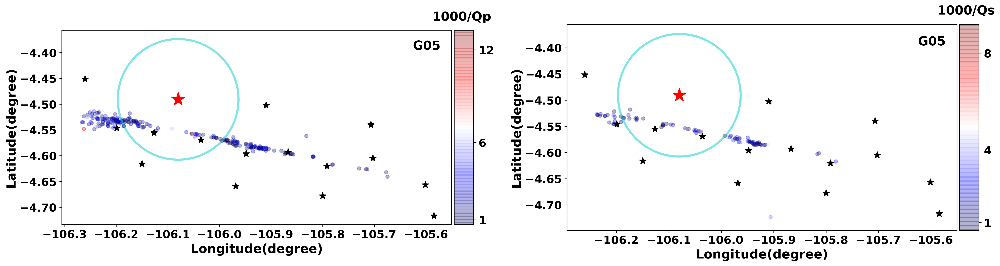

<Figure size 432x288 with 0 Axes>

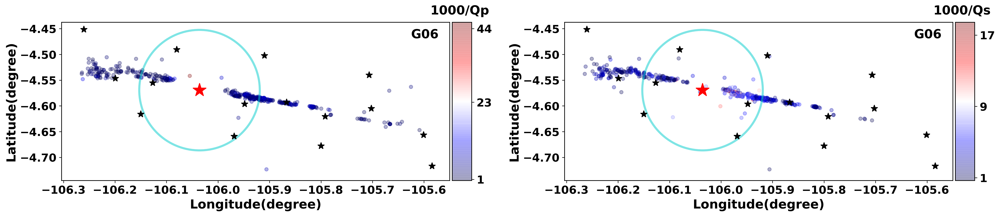

<Figure size 432x288 with 0 Axes>

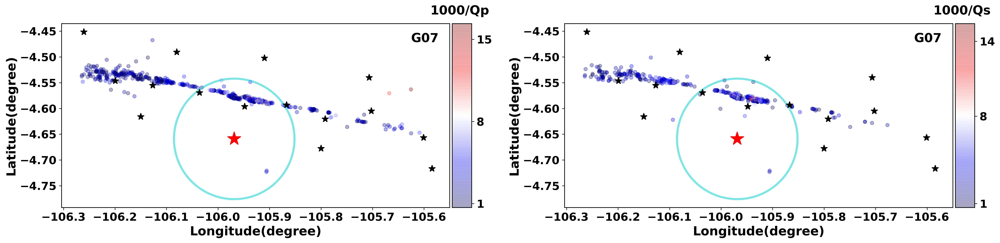

<Figure size 432x288 with 0 Axes>

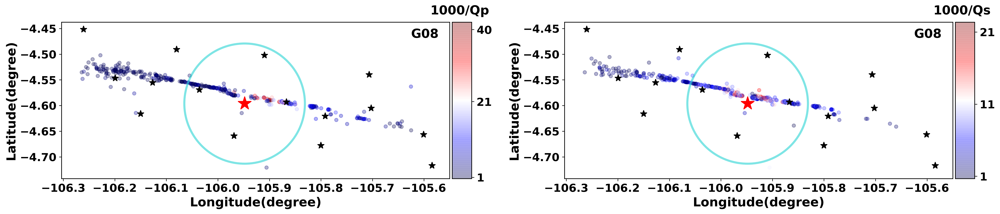

<Figure size 432x288 with 0 Axes>

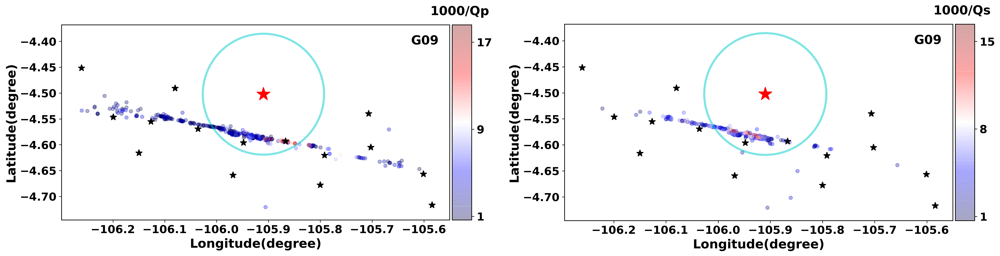

<Figure size 432x288 with 0 Axes>

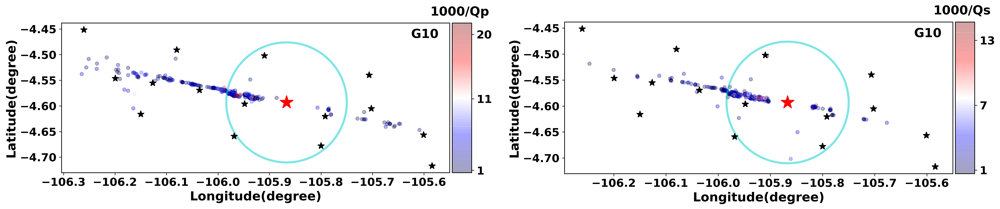

<Figure size 432x288 with 0 Axes>

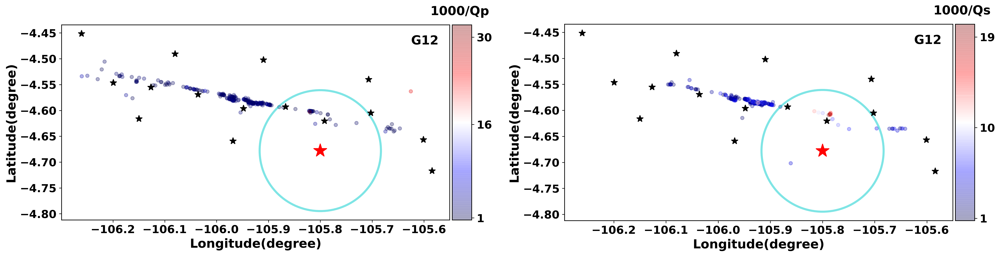

<Figure size 432x288 with 0 Axes>

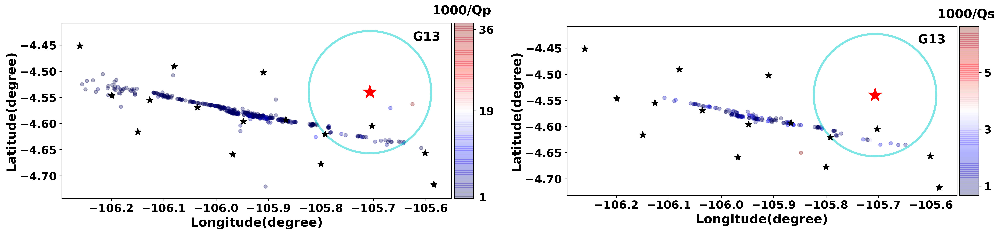

<Figure size 432x288 with 0 Axes>

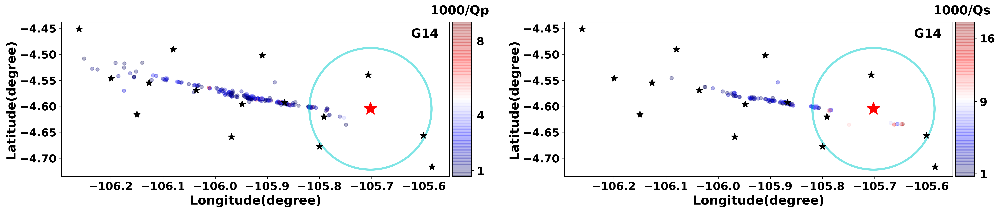

<Figure size 432x288 with 0 Axes>

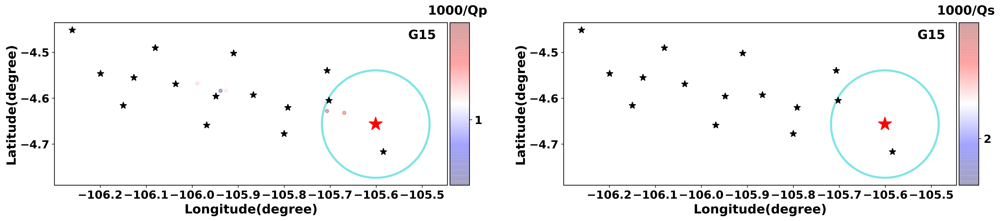

<Figure size 432x288 with 0 Axes>

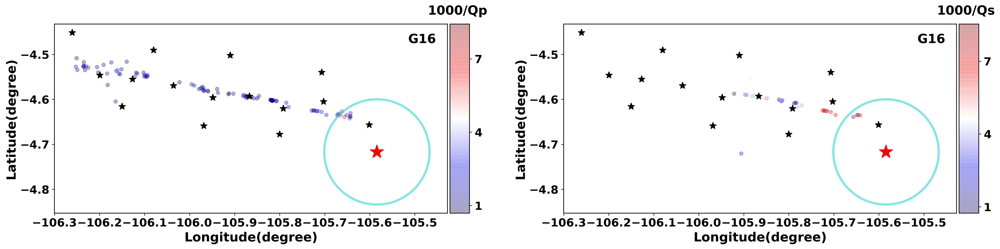

In [9]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from mpl_toolkits.axes_grid1 import make_axes_locatable
# read tstarPfile and tstarSfile
print(tstarPfile,tstarSfile)
TstarP_Dist=readTstarInformation(tstarPfile,EVE,STA,TravelTime,"P")
TstarS_Dist=readTstarInformation(tstarSfile,EVE,STA,TravelTime,"S")
distlimit=1000;
Qlim=2000;
for sta in ["G01","G02","G03","G04","G05",'G06','G07',"G08","G09","G10","G12","G13","G14","G15","G16"]:
    fig,ax=plt.subplots(1,2,figsize=(20,6))
    temp=np.array(TstarP_Dist[sta])
    index=np.nonzero(temp[:,-1] <Qlim )
#     distP=temp[index,1]
#     tstarP=temp[index,0]
#     evedep = temp[index,2]
#     evelon = temp[index,4]
#     evelat = temp[index,5]
#     time   = temp[index,7]
    distP=temp[index,1]
    tstarP=1000/temp[index,-1]
    evedep = temp[index,2]
    evelon = temp[index,4]
    evelat = temp[index,5]
    time   = temp[index,7]
    # tstar,dist,evedep,baz,evelon,evelat,mag,time
    im=ax[0].scatter(evelon,evelat,s=25,c=tstarP,cmap='seismic',alpha=0.3)
    circle=patches.Circle((STA[sta][0],STA[sta][1]), 0.117, facecolor='none',edgecolor=(0, 0.8, 0.8), linewidth=3, alpha=0.5)
    ax[0].add_patch(circle)
    for statemp in STA:
        ax[0].plot(STA[statemp][0],STA[statemp][1],'*k',markersize=10)
    ax[0].annotate(sta, xy=(0.9, 0.9), xycoords='axes fraction',fontsize=18)
    ax[0].plot(STA[sta][0],STA[sta][1],'r*',markersize=20)
    ax[0].set_xlabel('Longitude(degree)')
    ax[0].set_ylabel('Latitude(degree)')
    ax[0].axis('image')
  
#     plt.colorbar(im,ax=ax[0])
    divider = make_axes_locatable(ax[0])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    mintick=int(np.min(tstarP))+1
    maxtick=int(np.max(tstarP))-1
    midtick=int((np.max(tstarP)+np.min(tstarP))/2)
    cbar=plt.colorbar(im, cax=cax, orientation='vertical',ticks=[mintick,midtick,maxtick])
#     cbar.set_clim(0, 50)
#     cbar.ax.set_ylabel('Qp')
    ax[0].annotate("1000/Qp", xy=(0.95, 1.05), xycoords='axes fraction',fontsize=18)
    
    
    temp=np.array(TstarS_Dist[sta])
    index=np.nonzero(temp[:,-1] <Qlim )
    distS=temp[index,1]
    tstarS=1000/temp[index,-1]
    evedep = temp[index,2]
    evelon = temp[index,4]
    evelat = temp[index,5]
    time   = temp[index,7]
    # tstar,dist,evedep,baz,evelon,evelat,mag,time
    im=ax[1].scatter(evelon,evelat,s=25,c=tstarS,cmap='seismic',alpha=0.3)
    circle=patches.Circle((STA[sta][0],STA[sta][1]), 0.117, facecolor='none',edgecolor=(0, 0.8, 0.8), linewidth=3, alpha=0.5)
    ax[1].add_patch(circle)
    for statemp in STA:
        ax[1].plot(STA[statemp][0],STA[statemp][1],'*k',markersize=10)
    ax[1].annotate(sta, xy=(0.9, 0.9), xycoords='axes fraction',fontsize=18)
    ax[1].plot(STA[sta][0],STA[sta][1],'r*',markersize=20)
    ax[1].set_xlabel('Longitude(degree)')
    ax[1].set_ylabel('Latitude(degree)')
    ax[1].axis('image')
    divider = make_axes_locatable(ax[1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    mintick=int(np.min(tstarS))+1
    maxtick=int(np.max(tstarS))-1
    midtick=int((np.max(tstarS)+np.min(tstarS))/2)
    cbar=plt.colorbar(im, cax=cax, orientation='vertical',ticks=[mintick,midtick,maxtick])
#     cbar.ax.set_xlabel('Qs')
    ax[1].annotate("1000/Qs", xy=(0.95, 1.05), xycoords='axes fraction',fontsize=18)
    plt.tight_layout(w_pad=3)
    plt.savefig("./Figure/Q_XYdistribution_{}.jpg".format(sta))
    plt.pause(0.1)
    plt.clf()
    


In [ ]:
####backup the cell above


import matplotlib.pyplot as plt
import matplotlib.patches as patches
from mpl_toolkits.axes_grid1 import make_axes_locatable
# read tstarPfile and tstarSfile
print(tstarPfile,tstarSfile)
TstarP_Dist=readTstarInformation(tstarPfile,EVE,STA,TravelTime,"P")
TstarS_Dist=readTstarInformation(tstarSfile,EVE,STA,TravelTime,"S")
distlimit=1000;
Qlim=2000;
for sta in["G02","G04",'G06',"G08","G10"]:
    #["G01","G02","G03","G04","G05",'G06','G07',"G08","G09","G10","G12","G13","G14","G15","G16"]:
    fig,ax=plt.subplots(1,2,figsize=(20,6))
    temp=np.array(TstarP_Dist[sta])
    index=np.nonzero(temp[:,-1] <Qlim )
#     distP=temp[index,1]
#     tstarP=temp[index,0]
#     evedep = temp[index,2]
#     evelon = temp[index,4]
#     evelat = temp[index,5]
#     time   = temp[index,7]
    distP=temp[index,1]
    tstarP=1000/temp[index,-1]
    evedep = temp[index,2]
    evelon = temp[index,4]
    evelat = temp[index,5]
    time   = temp[index,7]
    # tstar,dist,evedep,baz,evelon,evelat,mag,time
    im=ax[0].scatter(evelon,evelat,s=25,c=tstarP,cmap='seismic',alpha=0.3)
    circle=patches.Circle((STA[sta][0],STA[sta][1]), 0.117, facecolor='none',edgecolor=(0, 0.8, 0.8), linewidth=3, alpha=0.5)
    ax[0].add_patch(circle)
    for statemp in STA:
        ax[0].plot(STA[statemp][0],STA[statemp][1],'*k',markersize=10)
    ax[0].annotate(sta, xy=(0.9, 0.9), xycoords='axes fraction',fontsize=18)
    ax[0].plot(STA[sta][0],STA[sta][1],'r*',markersize=20)
    ax[0].set_xlabel('Longitude(degree)')
    ax[0].set_ylabel('Latitude(degree)')
    ax[0].axis('image')
  
#     plt.colorbar(im,ax=ax[0])
    divider = make_axes_locatable(ax[0])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    cbar=plt.colorbar(im, cax=cax, orientation='vertical',ticks=[50,40,30,20,10,0])
#     cbar.set_clim(0, 50)
#     cbar.ax.set_ylabel('Qp')
    ax[0].annotate("1000/Qp", xy=(0.95, 1.05), xycoords='axes fraction',fontsize=18)
    
    
    temp=np.array(TstarS_Dist[sta])
    index=np.nonzero(temp[:,-1] <Qlim )
    distS=temp[index,1]
    tstarS=1000/temp[index,-1]
    evedep = temp[index,2]
    evelon = temp[index,4]
    evelat = temp[index,5]
    time   = temp[index,7]
    # tstar,dist,evedep,baz,evelon,evelat,mag,time
    im=ax[1].scatter(evelon,evelat,s=25,c=tstarS,cmap='seismic',alpha=0.3)
    circle=patches.Circle((STA[sta][0],STA[sta][1]), 0.117, facecolor='none',edgecolor=(0, 0.8, 0.8), linewidth=3, alpha=0.5)
    ax[1].add_patch(circle)
    for statemp in STA:
        ax[1].plot(STA[statemp][0],STA[statemp][1],'*k',markersize=10)
    ax[1].annotate(sta, xy=(0.9, 0.9), xycoords='axes fraction',fontsize=18)
    ax[1].plot(STA[sta][0],STA[sta][1],'r*',markersize=20)
    ax[1].set_xlabel('Longitude(degree)')
    ax[1].set_ylabel('Latitude(degree)')
    ax[1].axis('image')
    divider = make_axes_locatable(ax[1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    cbar=plt.colorbar(im, cax=cax, orientation='vertical',ticks=[25,20,15,10,5,0])
#     cbar.ax.set_xlabel('Qs')
    ax[1].annotate("1000/Qs", xy=(0.95, 1.05), xycoords='axes fraction',fontsize=18)
    plt.tight_layout(w_pad=3)
    plt.savefig("./Figure/{}Qdist.png".format(sta))
    plt.pause(0.1)
    plt.clf()
    
